In [71]:
import numpy as np
from scipy.stats import gamma
from sklearn.cluster import KMeans
from scipy.linalg import eigh
from scipy.optimize import fsolve
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_recall_curve, average_precision_score, auc
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os

import sys
from pathlib import Path

SRC_PATH = Path.cwd() / "src"
sys.path.insert(0, str(SRC_PATH))

from config import Config
from piramida import run_pyramid

## Pomoćni kod

In [72]:
def ucitaj_sliku(putanja, ciljana_velicina=(200, 200)):
    slika = Image.open(putanja)
    
    #pretvori u grayscale ako nije
    if slika.mode != 'L':
        slika = slika.convert('L')
    
    #smanji na 200x200 kao u radu
    slika = slika.resize(ciljana_velicina, Image.LANCZOS)
    
    #pretvori u numpy i normaliziraj
    slika_array = np.array(slika, dtype=np.float64) / 255.0
    
    return slika_array

In [73]:
def get_binary_masks(anomaly_scores, threshold=0.95, min_size=5):
    result = []
    for i in range(len(anomaly_scores)):
        mask = anomaly_scores[i] > np.quantile(anomaly_scores[i], threshold)
        clean_mask = remove_small_objects(mask.astype(bool), min_size=min_size)
        result.append(clean_mask.astype(int))
    return result

In [74]:
from matplotlib.colors import Normalize, ListedColormap, LinearSegmentedColormap, Normalize
import matplotlib as mpl

def robust_limits(x, lower=1, upper=99):
    x = np.asarray(x)
    x = x[np.isfinite(x)]
    return np.percentile(x, [lower, upper])

def quantile_map(x):
    x = np.asarray(x)
    flat = x.ravel()

    valid = np.isfinite(flat)
    ranks = np.empty_like(flat, dtype=float)
    ranks[:] = np.nan

    order = np.argsort(flat[valid])
    ranked = np.empty(np.sum(valid), dtype=float)
    ranked[order] = np.linspace(0, 1, np.sum(valid))

    ranks[valid] = ranked
    return ranks.reshape(x.shape)

def truncate_colormap(cmap_name="magma", minval=0.18, maxval=0.82, n=256):
    """
    Avoid the darkest and brightest ends of a colormap.
    This prevents black backgrounds and white-hot anomalies.
    """
    base = mpl.colormaps[cmap_name]
    colors = base(np.linspace(minval, maxval, n))
    return LinearSegmentedColormap.from_list(
        f"{cmap_name}_truncated_{minval}_{maxval}",
        colors
    )


def remap_quantiles_for_display(q, split=0.50, lower_fraction=0.35):
    """
    Preserve the full quantile range but allocate more color resolution
    to the upper quantiles.

    Quantiles [0.00, 0.50] -> color range [0.00, 0.35]
    Quantiles [0.50, 1.00] -> color range [0.35, 1.00]
    """
    q = np.asarray(q)
    out = np.empty_like(q, dtype=float)

    low = q <= split
    high = q > split

    out[low] = (q[low] / split) * lower_fraction
    out[high] = lower_fraction + (
        (q[high] - split) / (1 - split)
    ) * (1 - lower_fraction)

    return out

def plot_detection(
    original,
    scores,
    masks,
    n=5,
    figsize=(8.5, 10),
    dpi=300,
    savepath=None,
):
    original = np.asarray(original)
    scores = np.asarray(scores)
    masks = np.asarray(masks) > 0

    n = min(n, len(original))

    score_norm = Normalize(vmin=0, vmax=1)

    mask_cmap = ListedColormap([
        (1, 0, 0, 0.0),
        (1, 0, 0, 0.85),
    ])

    fig = plt.figure(figsize=figsize, dpi=dpi, facecolor="white")

    gs = fig.add_gridspec(
        nrows=n,
        ncols=5,
        width_ratios=[1, 1, 1, 1, 0.045],
        wspace=0.04,
        hspace=0.08,
    )

    axes = np.empty((n, 4), dtype=object)

    for i in range(n):
        for j in range(4):
            axes[i, j] = fig.add_subplot(gs[i, j])
            axes[i, j].set_xticks([])
            axes[i, j].set_yticks([])
            axes[i, j].set_facecolor("black")

            for spine in axes[i, j].spines.values():
                spine.set_visible(False)

        img_vmin, img_vmax = robust_limits(original[i], 1, 99)

        axes[i, 0].imshow(
            original[i],
            cmap="gray",
            vmin=img_vmin,
            vmax=img_vmax,
            interpolation="nearest",
        )

        score_quantiles = quantile_map(scores[i])
        score_display = remap_quantiles_for_display(
            score_quantiles,
            split=0.75,
            lower_fraction=0.25,
        )

        score_cmap = truncate_colormap("inferno", minval=0.05, maxval=0.8)

        im_score = axes[i, 1].imshow(
            score_display,
            cmap=score_cmap,
            norm=Normalize(vmin=0, vmax=1),
            interpolation="nearest",
        )

        axes[i, 2].imshow(
            masks[i],
            cmap="gray",
            vmin=0,
            vmax=1,
            interpolation="nearest",
        )

        axes[i, 3].imshow(
            original[i],
            cmap="gray",
            vmin=img_vmin,
            vmax=img_vmax,
            interpolation="nearest",
        )

        axes[i, 3].imshow(
            masks[i].astype(float),
            cmap=mask_cmap,
            vmin=0,
            vmax=1,
            interpolation="nearest",
        )

        if masks[i].any():
            axes[i, 3].contour(
                masks[i].astype(float),
                levels=[0.5],
                colors="white",
                linewidths=0.35,
                alpha=0.85,
            )

        # Row labels
        axes[i, 0].set_ylabel(
            f"Slika {i + 1}",
            fontsize=8,
            rotation=90,
            labelpad=10,
            va="center",
        )

    column_titles = [
        "Original",
        "Anomaly score",
        "Maska",
        "Overlay",
    ]

    for ax, title in zip(axes[0], column_titles):
        ax.set_title(title, fontsize=10, fontweight="semibold", pad=8)

    cax = fig.add_subplot(gs[:, 4])
    cbar = fig.colorbar(im_score, cax=cax)
    cbar.set_label("Anomaly score", fontsize=8)
    cbar.ax.tick_params(labelsize=7, length=2)
    cbar.outline.set_linewidth(0.5)

    if savepath is not None:
        fig.savefig(savepath, dpi=dpi, bbox_inches="tight", facecolor="white")

    plt.show()

    return fig, axes

### NG Beva

In [136]:
def ng_beva(X, max_iter=50, gamma_val=1.25, tol=0.01):
    """
    NG BEVA - Background Parameter Estimation

    Parameters:
        X : ndarray (N x p)  -> ulazni podaci (pikseli)
        max_iter : int       -> maksimalan broj iteracija
        gamma_val : float    -> parametar γ
        tol : float          -> tolerancija za zaustavljanje

    Returns:
        dict sa procijenjenim parametrima
    """

    N, p = X.shape

    # Čuvamo indekse originalnih podataka
    original_idx = np.arange(N)

    # Inicijalizacija
    A_c = np.array([], dtype=int)      # anomalni indeksi
    B_c = X.copy()                     # background podaci
    B_idx = original_idx.copy()        # indeksi background podataka

    w = np.ones(len(B_c))
    d0 = (np.sqrt(p) + np.sqrt(2))**2

    i = 0
    izbaceno_posto=0.01

    while i < max_iter and len(B_c) > 0:

        # 1. Robustna procjena sredine i kovarijacijske matrice
        w_sum = np.sum(w)

        mu = np.sum(w[:, None] * B_c, axis=0) / w_sum

        diff = B_c - mu

        w2 = w ** 2
        Sigma = (diff.T @ (w2[:, None] * diff)) / (np.sum(w2) - 1)

        # Regularizacija radi numeričke stabilnosti
        Sigma += 1e-6 * np.eye(p)

        # 2. Mahalanobis distance
        d = np.array([
            (x - mu).T @ np.linalg.solve(Sigma, (x - mu))
            for x in B_c
        ])

        # 3. Update težina
        w_new = np.where(
            d <= d0,
            1,
            (d0 / (d + 1e-8)) *
            np.exp(-0.5 * ((d - d0) ** 2) / (gamma_val ** 2))
        )

        # 4. Gamma fitting (MLE)
        k_hat, loc, theta_hat = gamma.fit(d + 1e-8, floc=0)

        # 5. Threshold 

        tau =  gamma.ppf(0.99, k_hat, scale=theta_hat)

        

        # Lokalni indeksi anomalija u trenutnom B_c
        idx = np.where(d >= tau)[0]

        if len(idx) == 0:
            break

        # Spremi ORIGINALNE indekse anomalija
        A_c = np.concatenate([A_c, B_idx[idx]])

        # Ukloni anomalije iz background skupa
        mask = np.ones(len(B_c), dtype=bool)
        mask[idx] = False

        B_c = B_c[mask]
        B_idx = B_idx[mask]
        w = w_new[mask]

        i += 1

        # Stopping kriterij
        izbaceno_posto = len(idx) / len(B_c) 

        if izbaceno_posto < tol:
            break

    return {
        "A_c": A_c,          # indeksi anomalija u originalnom X
        "B_c": B_idx,        # indeksi background elemenata u originalnom X
        "mu": mu,
        "Sigma": Sigma,
        "k_hat": k_hat,
        "theta_hat": theta_hat
    }

In [76]:
import numpy as np
from scipy.linalg import eigh
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import rbf_kernel


def clustering_nystrom(X, L=3, sigma=1.0, m=500):
    """
    Spectral clustering using Nyström approximation.

    Parameters
    ----------
    X : ndarray (N x p)
        Data matrix

    L : int
        Number of clusters

    sigma : float
        RBF kernel scale

    m : int
        Number of landmark points

    Returns
    -------
    labels : ndarray (N,)
        Cluster assignments
    """

    N = X.shape[0]

    # ---------------------------------------------------------
    # 1. Random landmark selection
    # ---------------------------------------------------------
    landmark_idx = np.random.choice(N, m, replace=False)

    X_landmarks = X[landmark_idx]

    # ---------------------------------------------------------
    # 2. Compute A matrix (m x m)
    # ---------------------------------------------------------
    #
    # Similarity among landmarks
    #
    gamma = 1.0 / (2.0 * sigma**2)

    A = rbf_kernel(
        X_landmarks,
        X_landmarks,
        gamma=gamma
    )

    # Stabilization
    A += 1e-8 * np.eye(m)

    # ---------------------------------------------------------
    # 3. Compute B matrix (m x N)
    # ---------------------------------------------------------
    #
    # Similarity between landmarks and ALL points
    #
    B = rbf_kernel(
        X_landmarks,
        X,
        gamma=gamma
    )

    # ---------------------------------------------------------
    # 4. Eigendecomposition of A only
    # ---------------------------------------------------------
    eigvals, eigvecs = eigh(A)

    # Take largest L eigenvalues
    eigvals = eigvals[-L:]
    eigvecs = eigvecs[:, -L:]

    # Numerical stability
    eigvals = np.maximum(eigvals, 1e-8)

    # ---------------------------------------------------------
    # 5. Nyström extension
    # ---------------------------------------------------------
    #
    # Approximate eigenvectors for ALL points
    #
    V = B.T @ eigvecs @ np.diag(1.0 / np.sqrt(eigvals))

    # ---------------------------------------------------------
    # 6. Row normalization
    # ---------------------------------------------------------
    norms = np.linalg.norm(V, axis=1, keepdims=True) + 1e-8
    V_norm = V / norms

    # ---------------------------------------------------------
    # 7. KMeans in spectral space
    # ---------------------------------------------------------
    kmeans = KMeans(
        n_clusters=L,
        n_init=10,
        random_state=0
    )

    labels = kmeans.fit_predict(V_norm)

    return labels

In [135]:
def detect(slika, br_klastera=3, sigma=10.0, m_za_poduzorak=500, max_iter=50, gamma_val=1.25, tol=0.01, ispis=True):
    # slika.size kod PIL slika vraća (širina, visina)
    h, w = slika.shape
    podaci = np.array(slika).reshape(-1, 1)
    
    rezultati = {}
    heatmap_mahalanobis = np.zeros(len(podaci))
    detekcija_maska = np.zeros(len(podaci))
    
    klasteri = clustering_nystrom(podaci, br_klastera, sigma, m_za_poduzorak)
    klasteri = np.array(klasteri)

    for i in np.unique(klasteri):
        idx_maska=np.where(klasteri == i)[0].astype(int) 
        X_fit = podaci[idx_maska]
    
        rezultat = ng_beva(X_fit, max_iter=max_iter, gamma_val=gamma_val, tol=tol)
        
        mu = rezultat["mu"]
        Sigma = rezultat["Sigma"]
        
        # Centriranje podataka (X - mu)
        X_centered = X_fit - mu
        
        # Rješavanje sustava Sigma * z = X_centered.T
        # Mahalanobis^2 = (X-mu).T * inv(Sigma) * (X-mu) 
        # Možemo izračunati z = inv(Sigma) * (X-mu).T rješavanjem sustava:
        try:
            # solve rješava AX = B, ovdje je A=Sigma, B=X_centered.T
            z = np.linalg.solve(Sigma, X_centered.T) 
            # Udaljenost je suma umnoška centriranih podataka i rješenja sustava (z)
            udaljenosti = np.sqrt(np.sum(X_centered * z.T, axis=1))
            heatmap_mahalanobis[idx_maska] = udaljenosti
        except np.linalg.LinAlgError:
            # U slučaju singularne matrice (npr. premalo točaka), koristi fallback
            heatmap_mahalanobis[idx_maska] = 0

        # Mapiranje detekcije
        A_c_izvorni = idx_maska[rezultat["A_c"].astype(int) ]
        B_c_izvorni = idx_maska[rezultat["B_c"].astype(int) ]
        
        detekcija_maska[A_c_izvorni] = 1 
        detekcija_maska[B_c_izvorni] = 0

        rezultati[i] = {
            "A_c": A_c_izvorni,
            "B_c": B_c_izvorni,
            "mu": mu,
            "Sigma": Sigma,
            "k_hat": rezultat["k_hat"],
            "theta_hat": rezultat["theta_hat"]
        }

    if ispis:
        # Iscrtavanje (reshape na h, w jer imshow očekuje Visina x Širina)
        fig, ax = plt.subplots(2, 2, figsize=(12, 10))
        ax[0, 0].imshow(np.array(slika))
        ax[0, 0].set_title("Original")
        
        ax[0, 1].imshow(klasteri.reshape(h, w), cmap='tab10')
        ax[0, 1].set_title("Klasteri")
        
        im = ax[1, 0].imshow(heatmap_mahalanobis.reshape(h, w), cmap='hot')
        ax[1, 0].set_title("Mahalanobis Heatmap")
        plt.colorbar(im, ax=ax[1, 0])
        
        viz_maska = np.zeros((len(detekcija_maska), 3))
        viz_maska[detekcija_maska == 1] = [1, 0, 0]  # Crvena za A_c (Anomalije)
        viz_maska[detekcija_maska == 0] = [0, 0, 1]  # Plava za B_c (Pozadina)
        
        ax[1, 1].imshow(viz_maska.reshape(h, w))
        ax[1, 1].set_title("Crveno: Anomalije (A_c), Plavo: Pozadina (B_c)")
        
        for a in ax.flat: a.axis('off')
        plt.tight_layout()
        plt.show()

    return {
        "rezultati": rezultati,
        "maska": detekcija_maska.reshape(h, w),
        "heatmap": heatmap_mahalanobis.reshape(h, w)
    }


### Metrike

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import average_precision_score
from skimage.measure import label, regionprops


def evaluate_algorithms(
    data,
    coverage_threshold=0.10,
    min_true_area=5,
    min_pred_area=5,
):
    def dice_from_counts(tp, fp, fn, eps=1e-8):
        return (2 * tp) / (2 * tp + fp + fn + eps)

    def pixel_counts(binary, mask):
        binary = binary.astype(bool)
        mask = mask.astype(bool)

        tp = np.logical_and(binary, mask).sum()
        fp = np.logical_and(binary, ~mask).sum()
        fn = np.logical_and(~binary, mask).sum()
        tn = np.logical_and(~binary, ~mask).sum()

        return tp, fp, fn, tn

    def average_precision(score, mask):
        if score is None:
            return np.nan

        y_true = mask.ravel().astype(int)
        y_score = score.ravel()

        if y_true.sum() == 0:
            return np.nan

        return average_precision_score(y_true, y_score)

    def true_object_count(mask):
        mask = mask.astype(bool)
        true_labels = label(mask, connectivity=2)

        true_regions = [
            region for region in regionprops(true_labels)
            if region.area >= min_true_area
        ]

        return len(true_regions)

    def fragmented_object_metrics(binary, mask):
        binary = binary.astype(bool)
        mask = mask.astype(bool)

        true_labels = label(mask, connectivity=2)
        pred_labels = label(binary, connectivity=2)

        true_regions = [
            region for region in regionprops(true_labels)
            if region.area >= min_true_area
        ]

        pred_regions = [
            region for region in regionprops(pred_labels)
            if region.area >= min_pred_area
        ]

        detected_objects = 0
        coverages = []

        for true_region in true_regions:
            true_object = true_labels == true_region.label

            overlap = np.logical_and(binary, true_object).sum()
            coverage = overlap / true_object.sum()

            coverages.append(coverage)

            if coverage >= coverage_threshold:
                detected_objects += 1

        false_alarms = 0

        for pred_region in pred_regions:
            pred_object = pred_labels == pred_region.label
            overlap_with_truth = np.logical_and(pred_object, mask).sum()

            if overlap_with_truth == 0:
                false_alarms += 1

        return {
            "detected_objects": detected_objects,
            "predicted_components": len(pred_regions),
            "false_alarms": false_alarms,
            "mean_object_coverage": np.mean(coverages) if coverages else np.nan,
        }

    summary_rows = []
    per_image_rows = []

    for dataset_name, dataset in data.items():

        masks = dataset["masks"]
        algorithms = dataset["algorithms"]

        true_objects_per_image = [
            true_object_count(np.asarray(mask) > 0)
            for mask in masks
        ]

        dataset_true_objects = sum(true_objects_per_image)

        for algorithm_name, values in algorithms.items():

            binaries = values["binaries"]

            # Scores are optional
            scores = values.get("scores", None)

            has_scores = scores is not None

            if has_scores:
                if len(scores) != len(masks):
                    raise ValueError(
                        f"Score/mask length mismatch for {dataset_name} / {algorithm_name}"
                    )

            if len(binaries) != len(masks):
                raise ValueError(
                    f"Binary/mask length mismatch for {dataset_name} / {algorithm_name}"
                )

            total_tp = 0
            total_fp = 0
            total_fn = 0
            total_tn = 0

            total_detected_objects = 0
            total_false_alarms = 0
            total_predicted_components = 0
            total_pixels = 0

            all_y_true = []
            all_y_score = []

            image_aps = []
            image_dices = []
            image_coverages = []

            for image_index, (binary, mask) in enumerate(zip(binaries, masks)):

                binary = np.asarray(binary) > 0
                mask = np.asarray(mask) > 0

                if binary.shape != mask.shape:
                    raise ValueError(
                        f"Binary/mask shape mismatch: "
                        f"{dataset_name}, {algorithm_name}, image {image_index}"
                    )

                if has_scores:
                    score = np.asarray(scores[image_index], dtype=float)

                    if score.shape != mask.shape:
                        raise ValueError(
                            f"Score/mask shape mismatch: "
                            f"{dataset_name}, {algorithm_name}, image {image_index}"
                        )

                    if score.max() > 1:
                        score = score / 255.0

                    ap = average_precision(score, mask)

                    all_y_true.append(mask.ravel().astype(int))
                    all_y_score.append(score.ravel())

                else:
                    score = None
                    ap = np.nan

                tp, fp, fn, tn = pixel_counts(binary, mask)
                dice = dice_from_counts(tp, fp, fn)

                obj = fragmented_object_metrics(binary, mask)

                total_tp += tp
                total_fp += fp
                total_fn += fn
                total_tn += tn

                total_detected_objects += obj["detected_objects"]
                total_false_alarms += obj["false_alarms"]
                total_predicted_components += obj["predicted_components"]
                total_pixels += mask.size

                image_aps.append(ap)
                image_dices.append(dice)
                image_coverages.append(obj["mean_object_coverage"])

                per_image_rows.append({
                    "dataset": dataset_name,
                    "algorithm": algorithm_name,
                    "image_index": image_index,

                    "has_score": has_scores,

                    "true_objects": true_objects_per_image[image_index],
                    "detected_objects": obj["detected_objects"],
                    "predicted_components": obj["predicted_components"],
                    "false_alarms": obj["false_alarms"],

                    "average_precision": ap,
                    "dice": dice,
                    "object_coverage": obj["mean_object_coverage"],

                    "tp_pixels": tp,
                    "fp_pixels": fp,
                    "fn_pixels": fn,
                    "tn_pixels": tn,
                })

            if has_scores and len(all_y_true) > 0:
                all_y_true = np.concatenate(all_y_true)
                all_y_score = np.concatenate(all_y_score)

                global_ap = (
                    average_precision_score(all_y_true, all_y_score)
                    if all_y_true.sum() > 0 else np.nan
                )
            else:
                global_ap = np.nan

            dataset_dice = dice_from_counts(total_tp, total_fp, total_fn)

            pixel_precision = total_tp / (total_tp + total_fp + 1e-8)
            pixel_recall = total_tp / (total_tp + total_fn + 1e-8)

            object_pd = (
                total_detected_objects / dataset_true_objects
                if dataset_true_objects > 0 else np.nan
            )

            false_alarms_per_image = total_false_alarms / len(masks)

            false_alarms_per_megapixel = (
                total_false_alarms / (total_pixels / 1_000_000)
                if total_pixels > 0 else np.nan
            )

            summary_rows.append({
                "dataset": dataset_name,
                "algorithm": algorithm_name,

                "has_scores": has_scores,

                "global_AP": global_ap,
                "mean_image_AP": np.nanmean(image_aps) if has_scores else np.nan,

                "dataset_dice": dataset_dice,
                "mean_image_dice": np.nanmean(image_dices),

                "pixel_precision": pixel_precision,
                "pixel_recall": pixel_recall,

                "object_PD": object_pd,
                "mean_object_coverage": np.nanmean(image_coverages),

                "true_objects": dataset_true_objects,
                "detected_objects": total_detected_objects,
                "missed_objects": dataset_true_objects - total_detected_objects,

                "predicted_components": total_predicted_components,
                "false_alarms": total_false_alarms,
                "false_alarms_per_image": false_alarms_per_image,
                "false_alarms_per_megapixel": false_alarms_per_megapixel,

                "num_images": len(masks),
            })

    summary_df = pd.DataFrame(summary_rows)
    per_image_df = pd.DataFrame(per_image_rows)

    summary_df = summary_df.sort_values(
        by=["dataset", "object_PD", "false_alarms_per_image", "dataset_dice"],
        ascending=[True, False, True, False]
    ).reset_index(drop=True)

    return summary_df, per_image_df

## Detekcija brodova

In [ ]:
shipwrecks = sorted(os.listdir("data/ships/"))
ships_path = "data/ships/"
ships_original = [ucitaj_sliku(ships_path + s, (200, 200)) for s in ships if not s.endswith('_true.jpg')]
ships_true = [(ucitaj_sliku(ships_path + s, (200, 200)) > 0.5).astype(int) for s in ships if s.endswith('_true.jpg')]
ships_lap_anom = [np.load("test/output/ships/" + s)
                  for s in sorted(os.listdir("test/output/ships"))
                  if s.startswith("lap_anom_")]
ships_lap_anom_masks = get_binary_masks(ships_lap_anom)
print(len(ships_original), len(ships_true), len(ships_lap_anom), len(ships_lap_anom_masks))

3 3 3 3


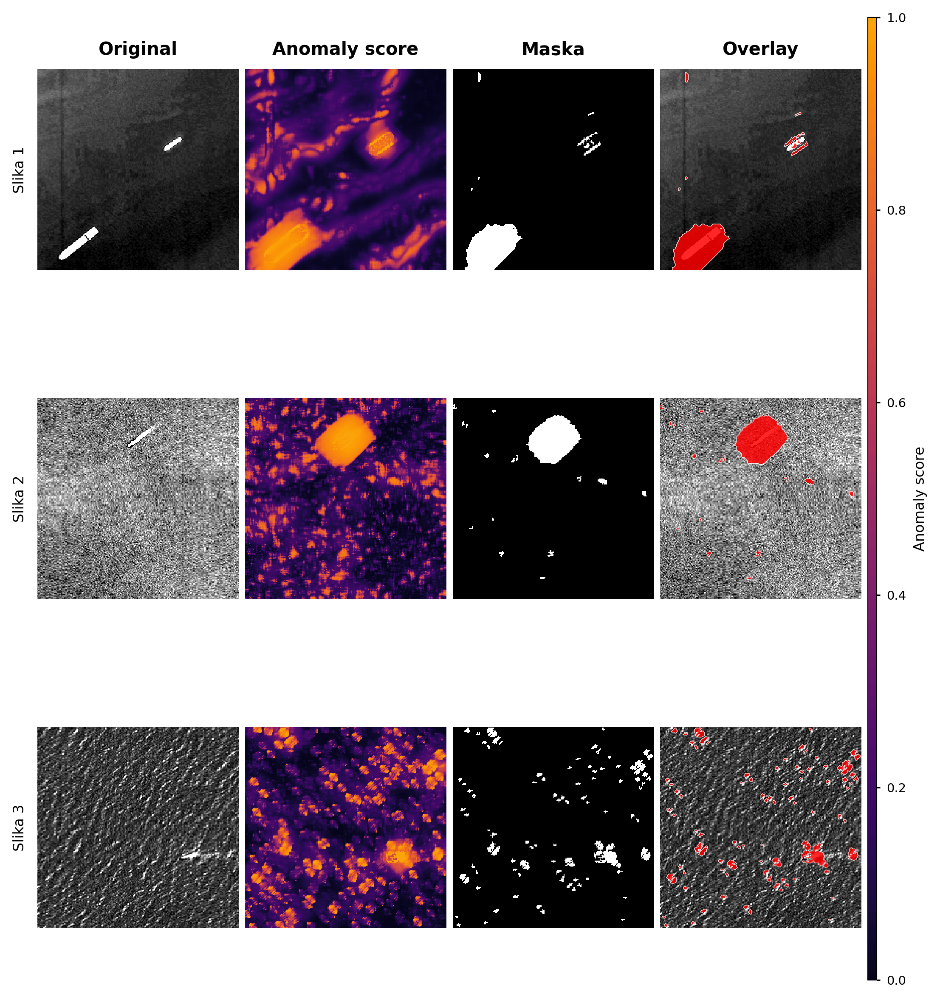

In [83]:
plot_detection(ships_original, ships_lap_anom, ships_lap_anom_masks);

## Brodolomi

### Laplacian - Anomaly Score

In [104]:
images = sorted([s
          for s in os.listdir(Path.cwd() / "data/shipwrecks")
          if s.endswith("500.jpg") and not s.startswith("Art")])
shipwreck_original = [ucitaj_sliku(Path.cwd() / "data/shipwrecks" / m, (200, 200))
                      for m in images]
shipwreck_lap_anom = [np.load("test/output/shipwrecks/" + s)
                      for s in sorted(list(os.listdir(Path.cwd() / "test/output/shipwrecks/")))
                      if s.startswith("lap_anom") and not s.startswith("lap_anom_Art")]
shipwreck_lap_anom_masks = get_binary_masks(shipwreck_lap_anom, threshold=0.9, min_size=10)

images_true = sorted([s
                    for s in os.listdir(Path.cwd() / "data/shipwrecks")
                    if s.endswith("true.jpg")])
shipwreck_true = [ucitaj_sliku(Path.cwd() / "data/shipwrecks" / m, (200, 200))
                      for m in images_true
                      if not m.startswith("Art")]
shipwreck_true = [np.rint(s) for s in shipwreck_true]
print(len(shipwreck_original), len(shipwreck_lap_anom), len(shipwreck_lap_anom_masks), len(shipwreck_true))

5 5 5 5


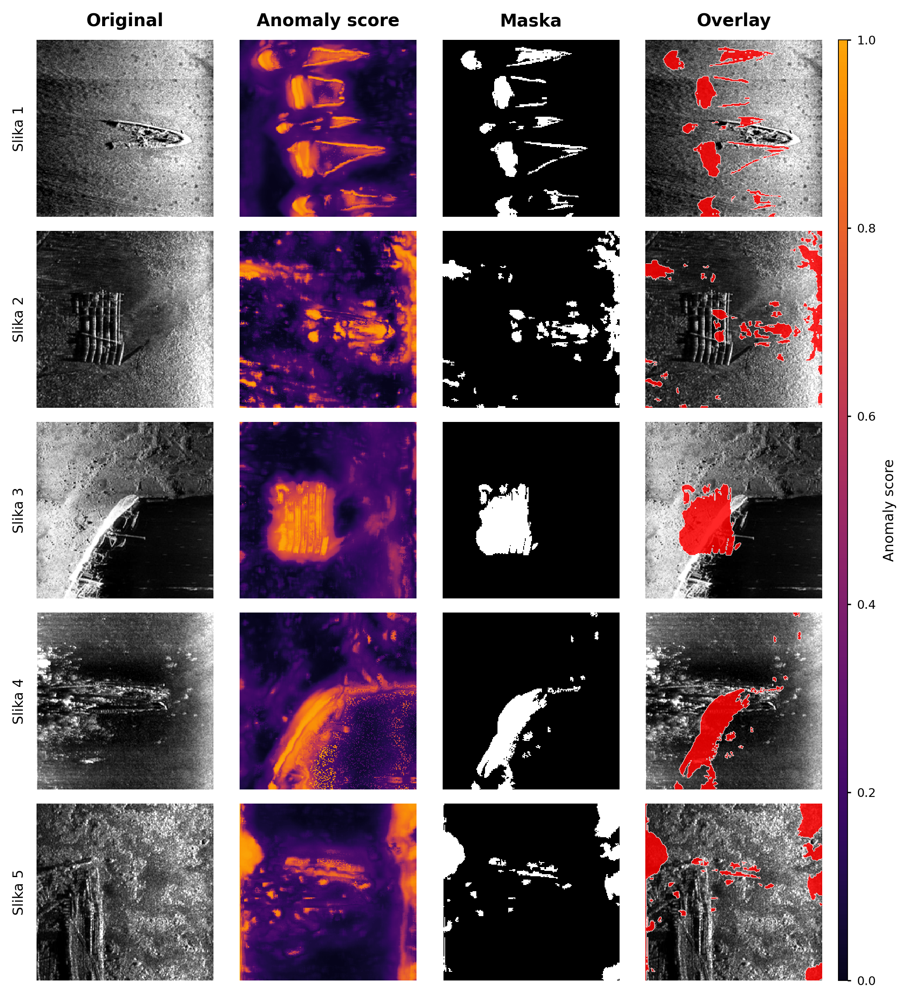

In [85]:
plot_detection(shipwreck_original, shipwreck_lap_anom, shipwreck_lap_anom_masks);

### Nystrom - Anomaly Score

In [86]:
shipwreck_nys_anom = [np.load("test/output/shipwrecks/" + s)
                      for s in sorted(list(os.listdir(Path.cwd() / "test/output/shipwrecks/")))
                      if s.startswith("nys_anom")]
shipwreck_nys_anom_masks = get_binary_masks(shipwreck_nys_anom, threshold=0.9, min_size=10)
print(len(shipwreck_nys_anom), len(shipwreck_nys_anom_masks))

5 5


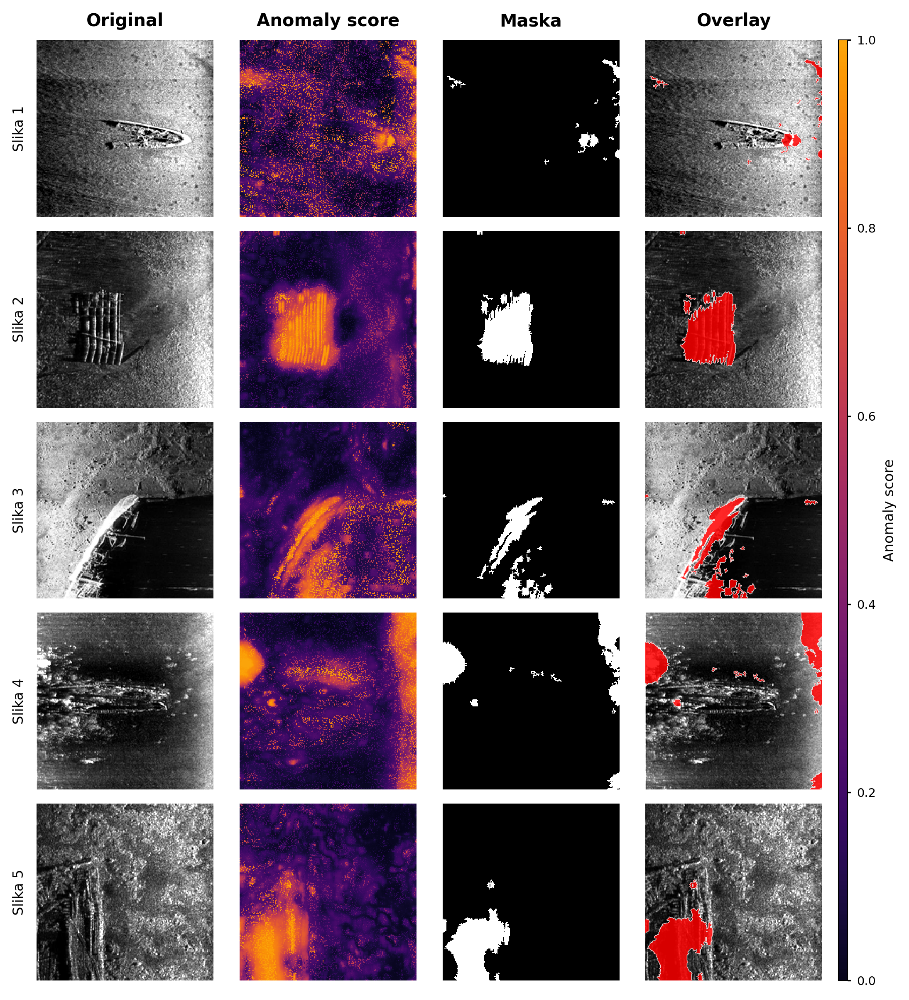

In [87]:
plot_detection(shipwreck_original, shipwreck_nys_anom, shipwreck_nys_anom_masks);

### Laplacian - Saliency

In [105]:
shipwreck_lap_sal = [np.load("test/output/shipwrecks/" + s)
                      for s in sorted(list(os.listdir(Path.cwd() / "test/output/shipwrecks/")))
                      if s.startswith("lap_sal") and not s.startswith("lap_sal_Art")]
shipwreck_lap_sal_masks = get_binary_masks(shipwreck_lap_sal, threshold=0.95, min_size=10)
print(len(shipwreck_lap_sal), len(shipwreck_lap_sal_masks))

5 5


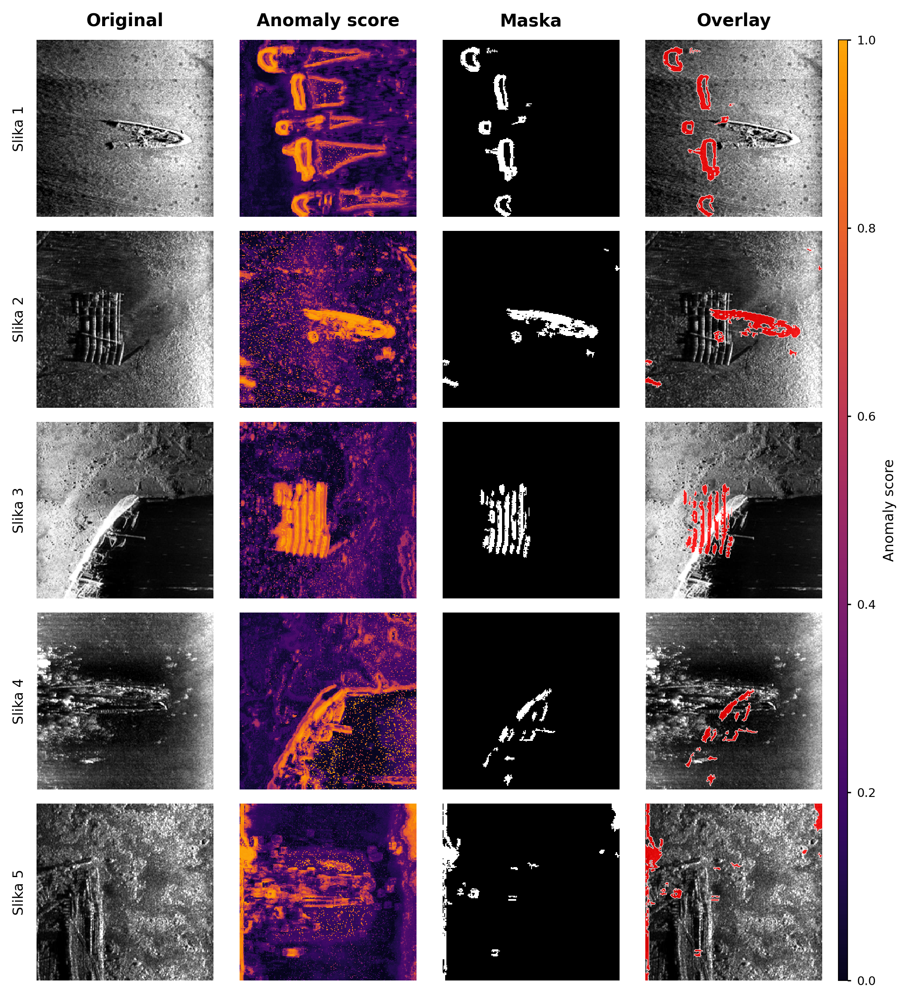

In [89]:
plot_detection(shipwreck_original, shipwreck_lap_sal, shipwreck_lap_sal_masks);

### Nystrom - Saliency

In [90]:
shipwreck_nys_sal = [np.load("test/output/shipwrecks/" + s)
                      for s in sorted(list(os.listdir(Path.cwd() / "test/output/shipwrecks/")))
                      if s.startswith("nys_sal")]
shipwreck_nys_sal_masks = get_binary_masks(shipwreck_nys_sal, threshold=0.95, min_size=10)
print(len(shipwreck_nys_sal), len(shipwreck_nys_sal_masks))

5 5


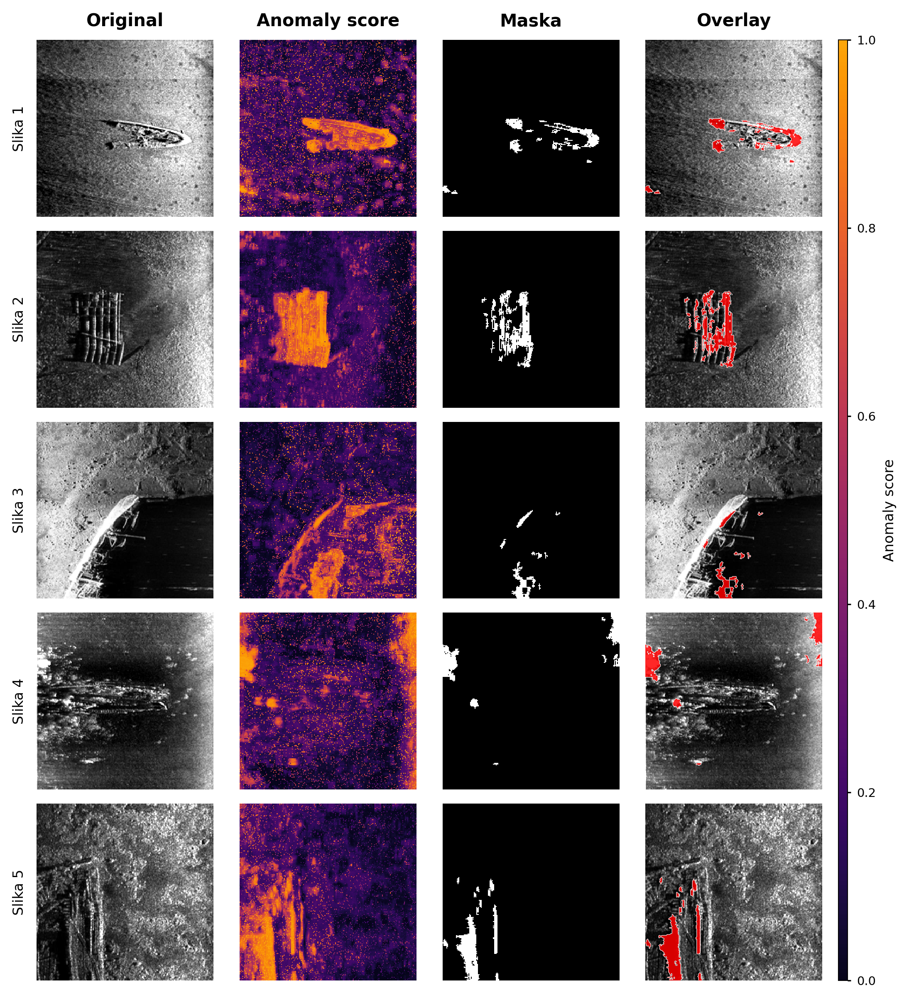

In [91]:
plot_detection(shipwreck_original, shipwreck_nys_sal, shipwreck_nys_sal_masks);

### NG-Beva

In [137]:
ng_rez = []
for im in shipwreck_original:
    ng_rez.append(detect(im, 1, ispis=False))
shipwreck_ng_heatmaps = [rez["heatmap"] for rez in ng_rez]
shipwreck_ng_masks = [rez["maska"] for rez in ng_rez]

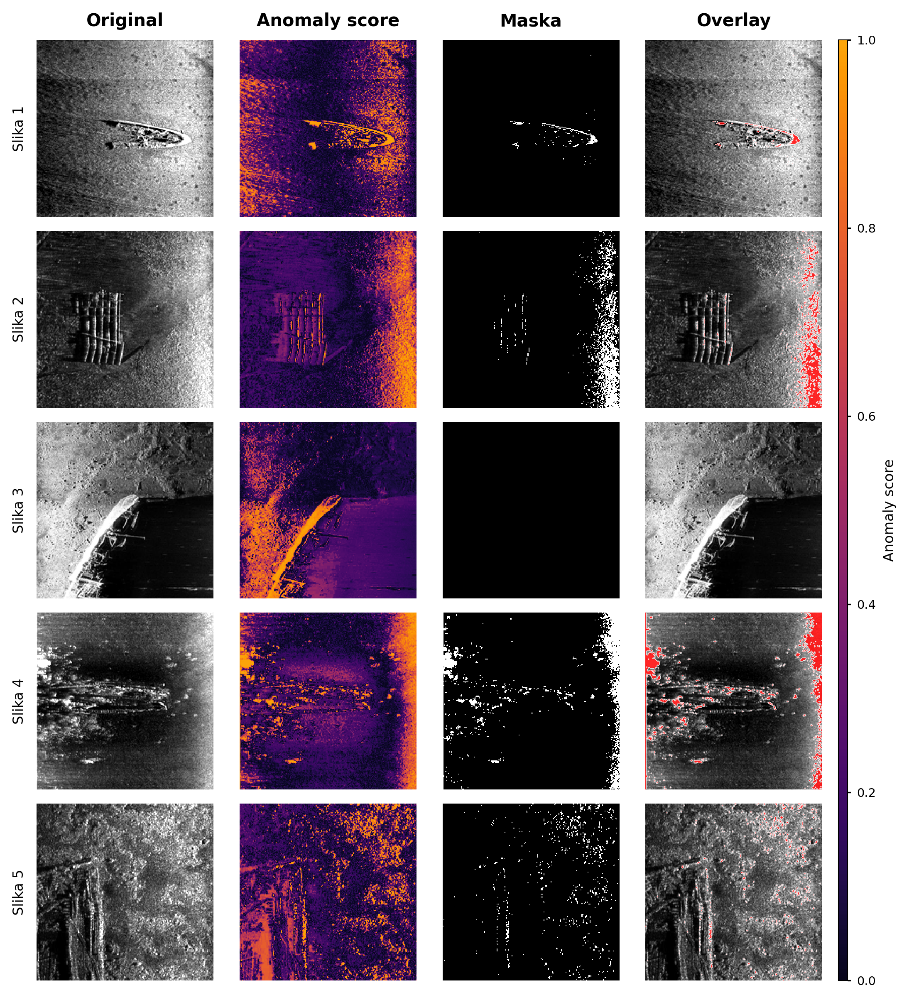

In [138]:
plot_detection(shipwreck_original, shipwreck_ng_heatmaps, shipwreck_ng_masks);

### Reefs

In [94]:
reef_original = ucitaj_sliku(Path.cwd() / "data/shipwrecks/Artificial_Reef_03_500.jpg", (200, 200))
reef_lap_anom = np.load("test/output/shipwrecks/lap_anom_Artificial_Reef_03_500.npy")
reef_lap_sal = np.load("test/output/shipwrecks/lap_sal_Artificial_Reef_03_500.npy")
reef_lap_anom_mask = get_binary_masks([reef_lap_anom], threshold=0.95, min_size=5)[0]
reef_lap_sal_mask = get_binary_masks([reef_lap_sal], threshold=0.95, min_size=5)[0]

In [95]:
reef_ng_beva = detect(reef_original, 2, ispis=False)

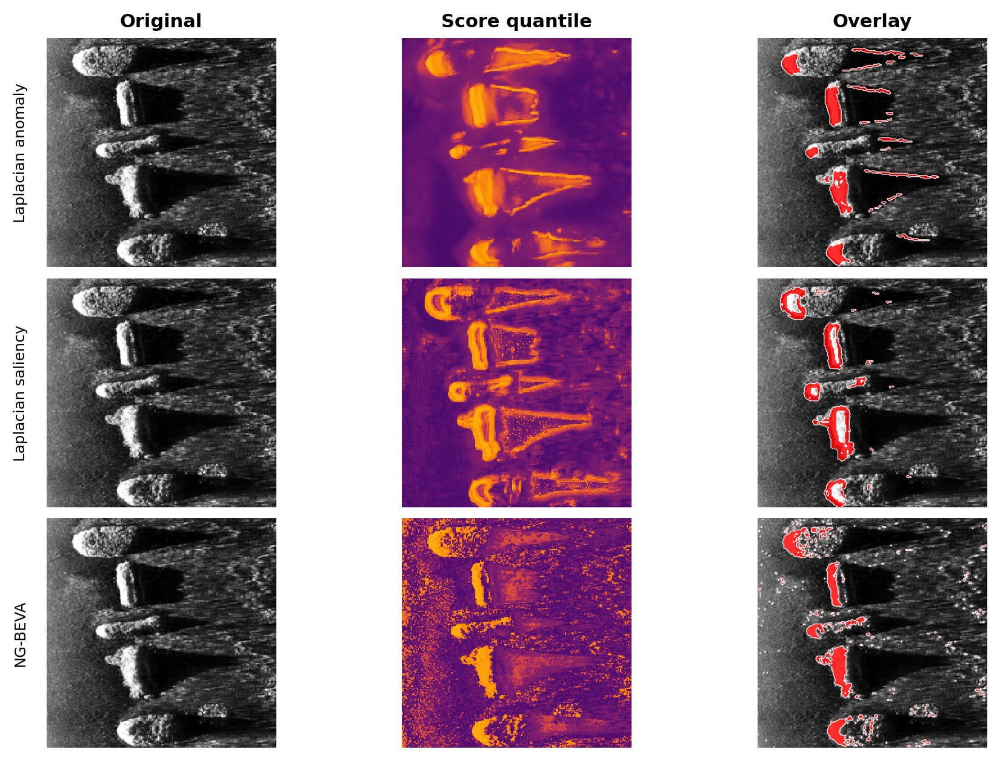

In [96]:
rows = [
    ("Laplacian anomaly", reef_lap_anom, reef_lap_anom_mask),
    ("Laplacian saliency", reef_lap_sal, reef_lap_sal_mask),
    ("NG-BEVA", reef_ng_beva["heatmap"], reef_ng_beva["maska"]),
]

fig, axes = plt.subplots(
    3, 3,
    figsize=(8, 5.6),
    dpi=220,
    constrained_layout=True,
    facecolor="white"
)

fig.patch.set_facecolor("white")

img_vmin, img_vmax = robust_limits(reef_original, 1, 99)
score_cmap = truncate_colormap("inferno", minval=0.22, maxval=0.82)
mask_cmap = ListedColormap([(1, 0, 0, 0.0), (1, 0, 0, 0.82)])

for i, (name, score, mask) in enumerate(rows):
    mask = np.asarray(mask) > 0

    score_q = quantile_map(score)
    score_show = remap_quantiles_for_display(score_q, split=0.75, lower_fraction=0.25)

    axes[i, 0].imshow(
        reef_original, cmap="gray",
        vmin=img_vmin, vmax=img_vmax,
        interpolation="nearest"
    )

    im = axes[i, 1].imshow(
        score_show, cmap=score_cmap,
        norm=Normalize(0, 1),
        interpolation="nearest"
    )

    axes[i, 2].imshow(
        reef_original, cmap="gray",
        vmin=img_vmin, vmax=img_vmax,
        interpolation="nearest"
    )
    axes[i, 2].imshow(
        mask.astype(float),
        cmap=mask_cmap,
        vmin=0, vmax=1,
        interpolation="nearest"
    )

    if mask.any():
        axes[i, 2].contour(
            mask.astype(float),
            levels=[0.5],
            colors="white",
            linewidths=0.45,
            alpha=0.9,
        )

    axes[i, 0].set_ylabel(name, fontsize=8, labelpad=10)

for ax in axes.ravel():
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

axes[0, 0].set_title("Original", fontsize=10, fontweight="semibold")
axes[0, 1].set_title("Score quantile", fontsize=10, fontweight="semibold")
axes[0, 2].set_title("Overlay", fontsize=10, fontweight="semibold")

plt.show()
plt.close(fig)

## Mine

### Laplacian - Anomaly Score

In [36]:
images = sorted([s
          for s in os.listdir(Path.cwd() / "data/mines")
          if s.endswith("2021.jpg")])
mines_original = [ucitaj_sliku(Path.cwd() / "data/mines" / m, (200, 200))
                      for m in images]
mines_lap_anom = [np.load("test/output/mines/" + s)
                      for s in sorted(list(os.listdir(Path.cwd() / "test/output/mines/")))
                      if s.startswith("lap_anom")]
mines_lap_anom_masks = get_binary_masks(mines_lap_anom, threshold=0.9, min_size=10)

images_true = sorted([s
                    for s in os.listdir(Path.cwd() / "data/mines")
                    if s.endswith("true.jpg")])
mines_true = [ucitaj_sliku(Path.cwd() / "data/mines" / m, (200, 200))
                      for m in images_true]
mines_true = [np.rint(s) for s in mines_true]
print(len(mines_original), len(mines_lap_anom), len(mines_lap_anom_masks), len(mines_true))

5 5 5 5


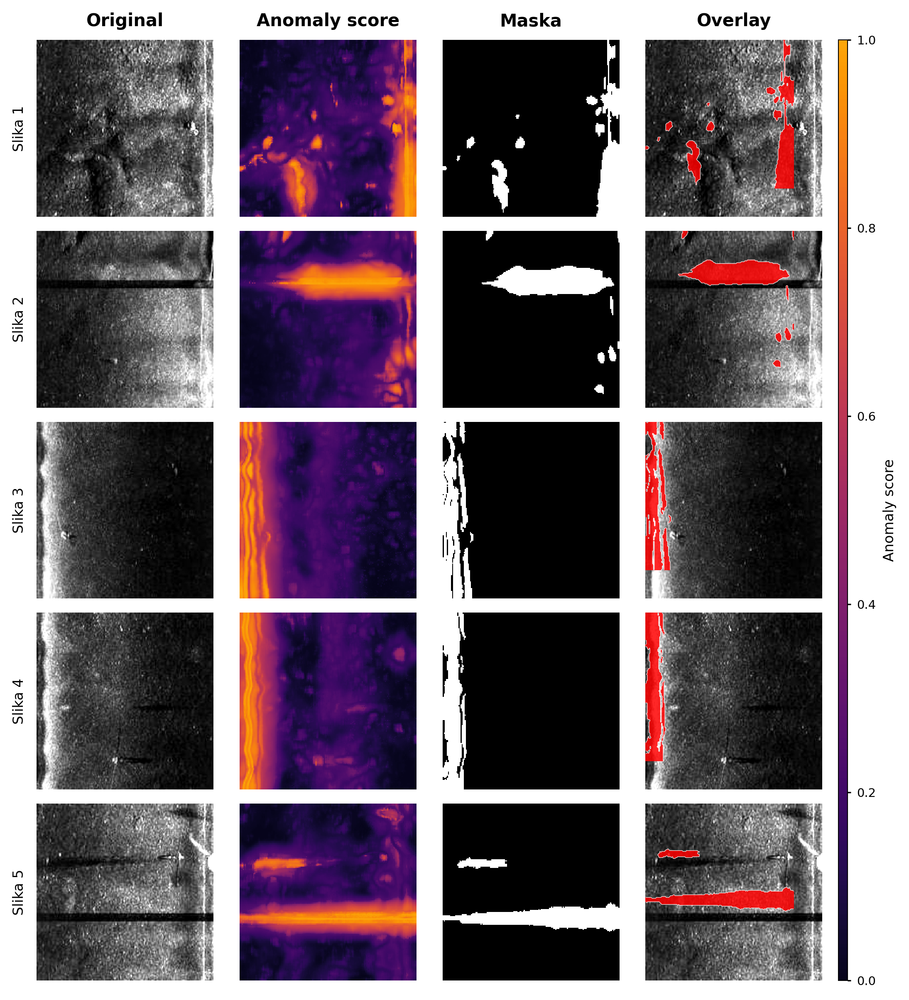

In [37]:
plot_detection(mines_original, mines_lap_anom, mines_lap_anom_masks);

### Nystrom - Anomaly Score

In [ ]:
mines_nys_anom = [np.load("test/output/mines/" + s)
                      for s in sorted(list(os.listdir(Path.cwd() / "test/output/mines/")))
                      if s.startswith("nys_anom")]
mines_nys_anom_masks = get_binary_masks(mines_nys_anom, threshold=0.9, min_size=10)
print(len(mines_nys_anom), len(mines_nys_anom_masks))

5 5


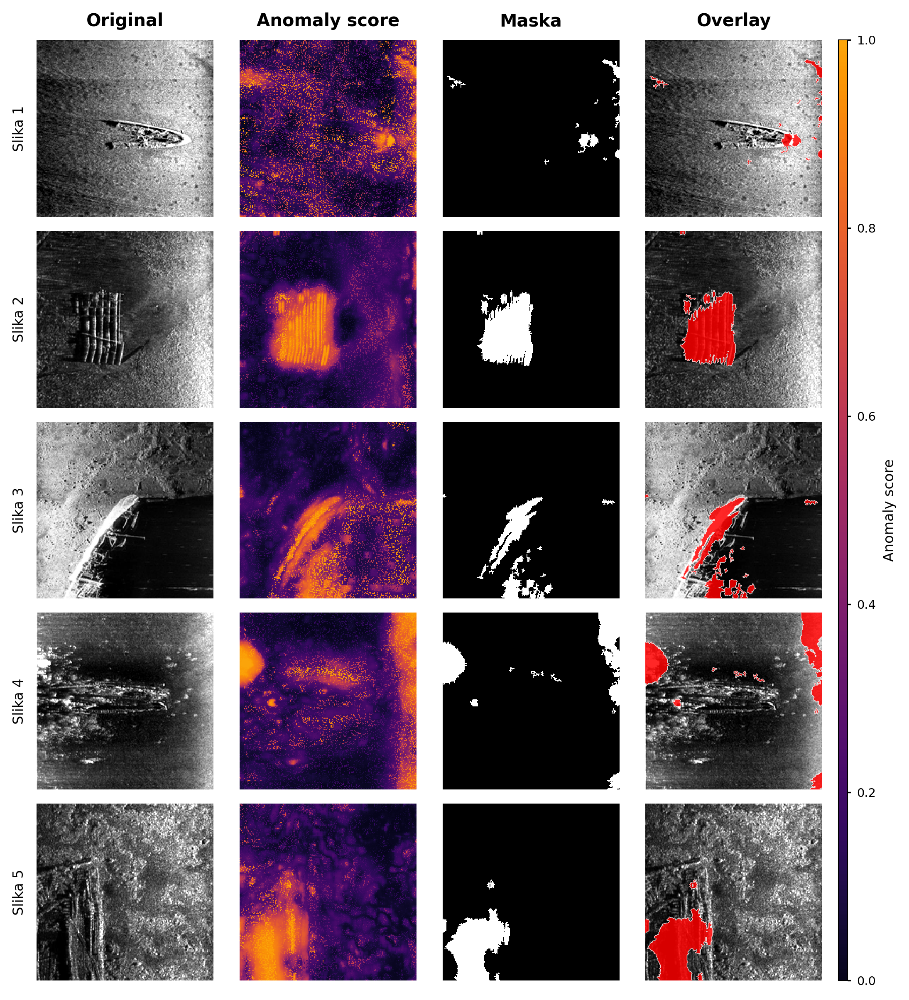

In [ ]:
plot_detection(mines_original, mines_nys_anom, mines_nys_anom_masks);

### Laplacian - Saliency

In [ ]:
mines_lap_sal = [np.load("test/output/mines/" + s)
                      for s in sorted(list(os.listdir(Path.cwd() / "test/output/mines/")))
                      if s.startswith("lap_sal")]
mines_lap_sal_masks = get_binary_masks(mines_lap_sal, threshold=0.95, min_size=10)
print(len(mines_lap_sal), len(mines_lap_sal_masks))

5 5


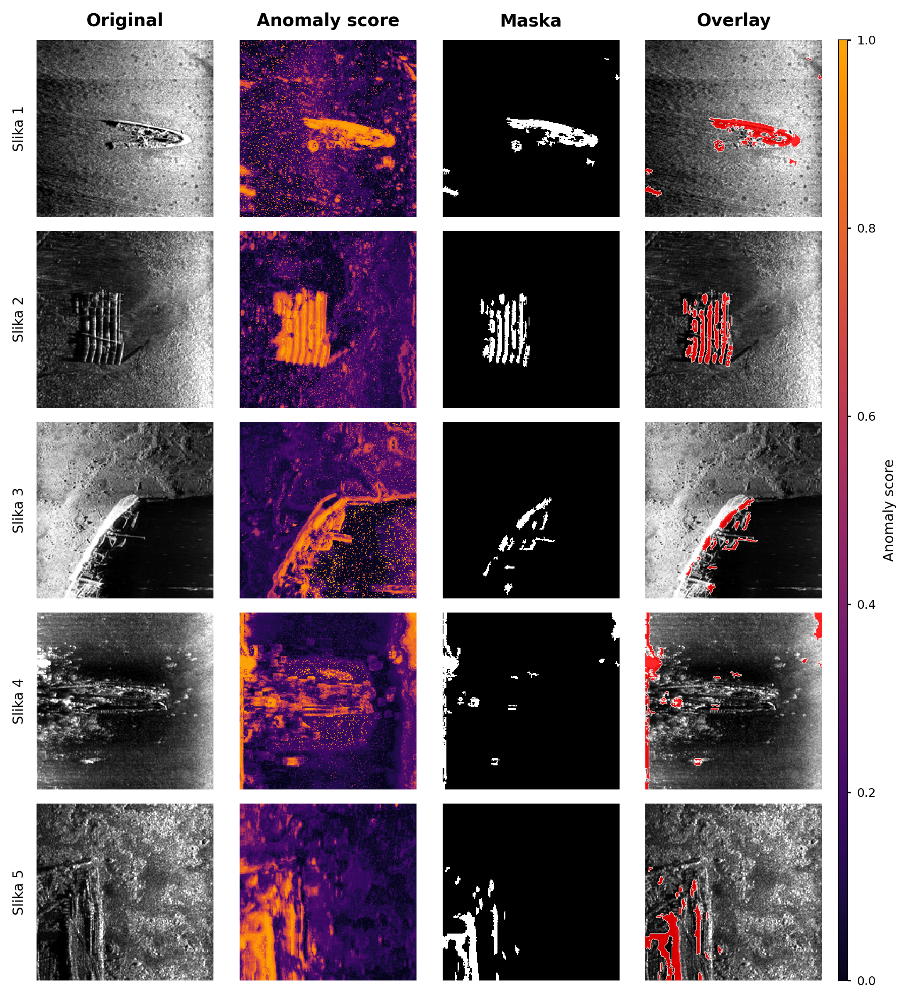

In [ ]:
plot_detection(mines_original, mines_lap_sal, mines_lap_sal_masks);

### Nystrom - Saliency

In [ ]:
mines_nys_sal = [np.load("test/output/mines/" + s)
                      for s in sorted(list(os.listdir(Path.cwd() / "test/output/mines/")))
                      if s.startswith("nys_sal")]
mines_nys_sal_masks = get_binary_masks(mines_nys_sal, threshold=0.95, min_size=10)
print(len(mines_nys_sal), len(mines_nys_sal_masks))

5 5


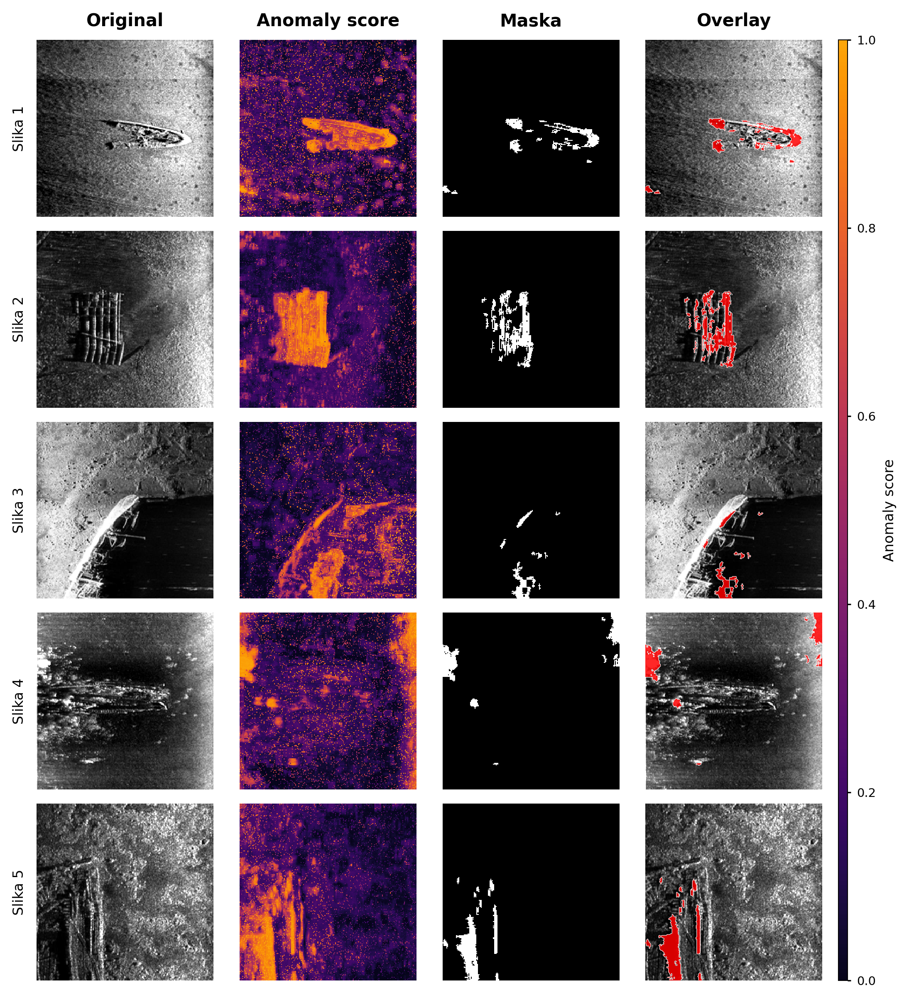

In [ ]:
plot_detection(mines_original, mines_nys_sal, mines_nys_sal_masks);

### NG-Beva

In [ ]:
ng_rez = []
for im in mines_original:
    ng_rez.append(detect(im, 1, ispis=False))
mines_ng_heatmaps = [rez["heatmap"] for rez in ng_rez]
mines_ng_masks = [rez["maska"] for rez in ng_rez]

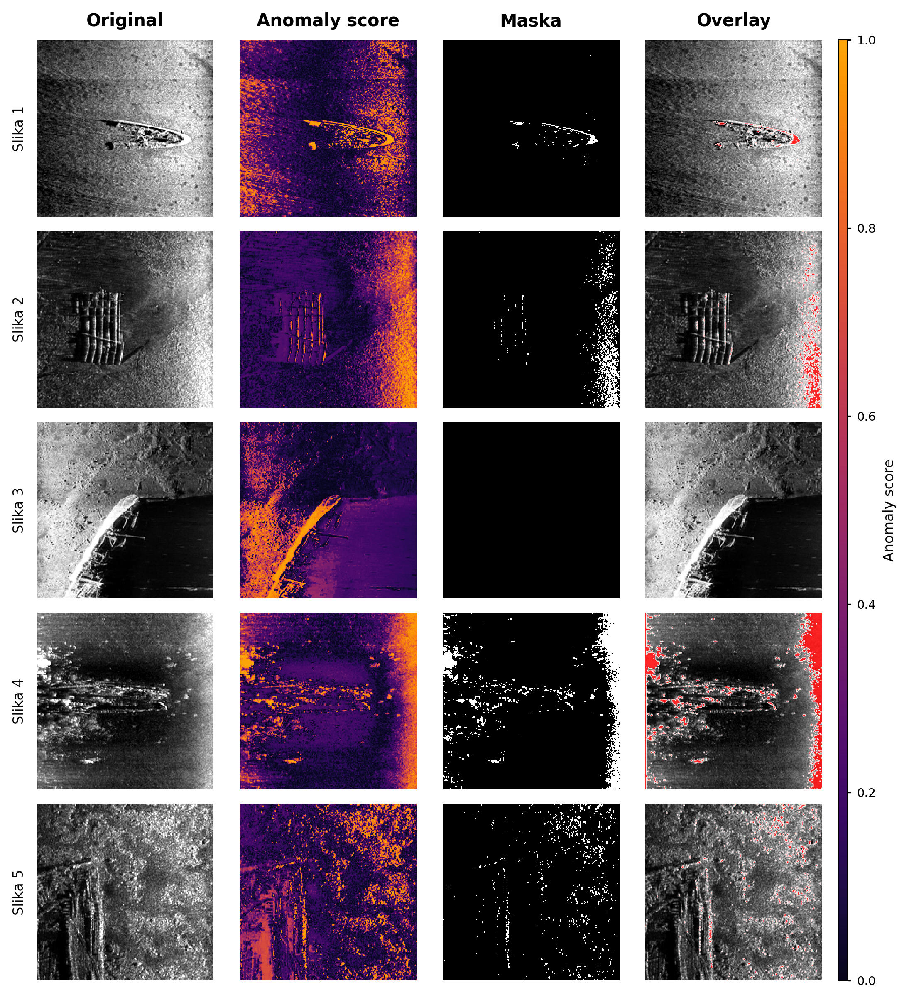

In [ ]:
plot_detection(mines_original, mines_ng_heatmaps, mines_ng_masks);

## Sveukupna usporedba

In [125]:
data = {
    "shipwrecks": {
        "masks": shipwreck_true,

        "algorithms": {
            "lap_anom": {
                "scores":   shipwreck_lap_anom,
                "binaries": shipwreck_lap_anom_masks,
            },
            "lap_sal": {
                "scores":   shipwreck_lap_sal,
                "binaries": shipwreck_lap_sal_masks,
            },
            "nys_anom": {
                "scores": shipwreck_nys_anom,
                "binaries": shipwreck_nys_anom_masks
            },
            "nys_sal": {
                "scores": shipwreck_nys_sal,
                "binaries": shipwreck_nys_sal_masks
            },
            "ng_beva": {
                "binaries": shipwreck_ng_masks
            }
        }
    }
}

In [ ]:
summary_df, per_image_df = evaluate_algorithms(
    data,
    coverage_threshold=0.10,
    min_true_area=5,
    min_pred_area=5,
)

In [129]:
summary_df

,dataset,algorithm,has_scores,global_AP,mean_image_AP,dataset_dice,mean_image_dice,pixel_precision,pixel_recall,object_PD,mean_object_coverage,true_objects,detected_objects,missed_objects,predicted_components,false_alarms,false_alarms_per_image,false_alarms_per_megapixel,num_images
0,shipwrecks,lap_sal,True,0.551842,0.600713,0.302701,0.321120,0.817643,0.185730,0.8,0.207517,5,4,1,63,11,2.2,55.0,5
1,shipwrecks,lap_anom,True,0.526376,0.635696,0.471521,0.474205,0.659619,0.366897,0.8,0.384574,5,4,1,92,46,9.2,230.0,5
2,shipwrecks,nys_sal,True,0.344277,0.502111,0.215174,0.224840,0.763510,0.125234,0.6,0.138121,5,3,2,50,11,2.2,55.0,5
3,shipwrecks,nys_anom,True,0.443513,0.542990,0.401085,0.372269,0.727350,0.276884,0.6,0.278871,5,3,2,46,25,5.0,125.0,5
4,shipwrecks,ng_beva,False,NaN,NaN,0.056320,0.055196,0.158243,0.034256,0.0,0.035883,5,0,5,163,113,22.6,565.0,5
